<a href="https://colab.research.google.com/github/lifesboy/selks-lstm-data/blob/main/SELKS_LSTM_Anomaly_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.LSTM KERAS

docs lib: https://keras.io/api/layers/recurrent_layers/lstm/

# 2.PREPARATION

In [1]:
#@title Check version vs GPU
!git --version
!python --version
!ray --version

import tensorflow as tf
print('tf version: ', tf.__version__)
print('tf.keras version:', tf.keras.__version__)

import sys
sys.version

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

git version 2.20.1
Python 2.7.16
ray, version 1.13.0
tf version:  2.7.0
tf.keras version: 2.7.0
Found GPU at: /device:GPU:0


2023-01-27 13:13:59.569734: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-27 13:14:02.805576: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-27 13:14:02.806870: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-27 13:14:02.808002: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capabilit

In [2]:
#@title Import Libraries
!mkdir -p /cic/images/

import sys
sys.path.insert(0, "/usr/local/opnsense/scripts/ml")

import json
import ray
import pyarrow
import pyarrow as pa
from pyarrow import csv
from pandas import DataFrame

from ray.data import Dataset
from ray.data.aggregate import Count

import numpy as np
from numpy import array
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras import Input


import common
from anomaly_normalization import PS, LABEL, PAYLOAD_FEATURE_NUM, ALL_FEATURES
from aimodels.preprocessing.cicflowmeter_norm_model import CicFlowmeterNormModel
from aitests.testutils import show_scattered_4d, show_weights, show_4d_imgs, show_train_metric, IMG,\
read_csv_in_dir, read_csv_in_dir_label_string

run, client = common.init_experiment(name='notebook')


2023-01-27 13:14:05,981[INFO][140039282210624-MainThread] worker.py:init(957) Connecting to existing Ray cluster at address: 172.18.12.180:6379


# 3.INPUT
Let's generate a sample input with time dimension as below:

In [3]:
#@title Generate an input sequence
#10.0.2.10
#10.0.2.155
#10.0.2.180
#10.0.2.181
#10.0.2.182
#192.168.66.39
#192.168.66.21

cell_size = 320 #@param {type:"integer"} #numberOfLSTMunits
hidden_size = 230 #@param {type:"integer"}
n_timesteps_in = 100  #@param {type:"integer"}
n_features = 79   #@param {type:"integer"}

# generate datasets
train_size= 6000 #@param {type:"integer"}
test_size = 600  #@param {type:"integer"}
batch_size=32 #@param {type:"integer"}
epochs=100 #@param {type:"integer"}

L_fsource = '/cic/dataset/featured_extracted/ssh-bruteforce-cic2018' #@param {type:"string"}
L_fdata: Dataset = read_csv_in_dir_label_string(L_fsource)
L_fcount: DataFrame = L_fdata.groupby(LABEL).aggregate(Count()).to_pandas()

features = ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pkt_len_max', 'pkt_len_mean', 'pkt_len_min', 'pkt_len_std', 'pkt_len_var', 'pkt_size_avg', 'protocol', 'psh_flag_cnt', 'rst_flag_cnt', 'src_port', 'subflow_bwd_byts', 'subflow_bwd_pkts', 'subflow_fwd_byts', 'subflow_fwd_pkts', 'syn_flag_cnt', 'tot_bwd_pkts', 'tot_fwd_pkts', 'totlen_bwd_pkts', 'totlen_fwd_pkts', 'urg_flag_cnt']
#features = [*features, *[PS % i for i in range(0, PAYLOAD_FEATURE_NUM)]]
features = features[0: n_features]
Lfpadding_features = sorted(list(set(features) - set(L_fdata.schema(fetch_if_missing=True).names)))

print ('features=', features)
print ('Lfpadding_features=', Lfpadding_features)

L_ftrain = DataFrame.from_records(L_fdata.take(train_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftrain[Lfpadding_features] = 0
#L_ftrain[LABEL] = L_ftrain.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftrain[LABEL] = L_ftrain[LABEL].apply(lambda x: 0 if x == 'Benign' else 1)
LX_ftrain = L_ftrain[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_ftrain = L_ftrain[[LABEL]].to_numpy().reshape(train_size, n_timesteps_in)

L_ftest = DataFrame.from_records(L_fdata.take(test_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftest[Lfpadding_features] = 0
#L_ftest[LABEL] = L_ftest.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftest[LABEL] = L_ftest[LABEL].apply(lambda x: 0 if x == 'Benign' else 1)
LX_ftest = L_ftest[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_ftest = L_ftest[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

2023-01-27 13:14:07,811	WARNING read_api.py:256 -- The number of blocks in this dataset (11) limits its parallelism to 11 concurrent tasks. This is much less than the number of available CPU slots in the cluster. Use `.repartition(n)` to increase the number of dataset blocks.
Shuffle Reduce: 100%|██████████| 1/1 [00:00<00:00, 85.60it/s]


features= ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pk

In [4]:
L_fcount

,label,count()
0,Benign,667626
1,FTP-BruteForce,193360
2,SSH-Bruteforce,187589


## Data preview

### L_ftrain preview

In [5]:
L_ftrain[[LABEL, *features]]

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112641719.0,56320958.0,5.632086e+07,56320761.0,139.300036,0.026633,0.0,0.0,0.0,0.0,56320958.0,5.632086e+07,56320761.0,139.300036,112641719.0,0.0,0.000000,0.0,0.000000,0.0,0.026633,0.0,0.000000,0.0,0.0,56320958.0,56320859.5,56320761.0,139.300036,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112641466.0,56320814.0,5.632073e+07,56320652.0,114.551299,0.026633,0.0,0.0,0.0,0.0,56320814.0,5.632073e+07,56320652.0,114.551299,112641466.0,0.0,0.000000,0.0,0.000000,0.0,0.026633,0.0,0.000000,0.0,0.0,56320814.0,56320733.0,56320652.0,114.551299,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112638623.0,56319525.0,5.631931e+07,56319098.0,301.934596,0.026634,0.0,0.0,0.0,0.0,56319525.0,5.631931e+07,56319098.0,301.934596,112638623.0,0.0,0.000000,0.0,0.000000,0.0,0.026634,0.0,0.000000,0.0,0.0,56319525.0,56319311.5,56319098.0,301.934596,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,328.0,1167293.0,626433.555556,554.0,455082.214224,5637902.0,976.0,227.300000,0.0,371.677892,0.0,1.549435,0.0,227.300000,0.0,0.0,0.0,22.0,0.0,0.0,544.161528,6453966.0,673900.0,2.689152e+05,22.0,247443.778966,3.873587,6.0,0.0,0.0,488.0,673900.0,4.609976e+05,229740.0,123109.423588,6453966.0,744.0,82.600000,0.0,196.741237,0.0,2.324152,0.0,82.600000,32.0,0.0,0.0,0.0,0.0,0.000000,233.0,65535.0,976.0,135.076923,0.0,277.834760,77192.153846,140.480000,6.0,1.0,0.0,0,2273.0,10.0,1239.0,15.0,0.0,10.0,15.0,2273.0,1239.0,0.0
4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,360.0,2174893.0,771548.100000,90.0,755543.082717,7715481.0,976.0,200.818182,0.0,362.249864,0.0,1.249423,0.0,200.818182,0.0,0.0,0.0,22.0,0.0,0.0,380.733175,8804066.0,1928102.0,3.668361e+05,21.0,511356.609733,2.839597,6.0,0.0,0.0,456.0,1928102.0,6.772358e+05,246924.0,532416.970959,8804066.0,744.0,81.642857,0.0,203.745545,0.0,1.590174,0.0,81.642857,32.0,0.0,0.0,0.0,0.0,0.000000,233.0,5808.0,976.0,128.923077,0.0,279.763032,78267.353846,134.080000,6.0,1.0,0.0,0,2209.0,11.0,1143.0,14.0,0.0,11.0,14.0,2209.0,1143.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [6]:
L_ftrain[[LABEL, *features]].describe()

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
count,600000.000000,600000.000000,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.0,600000.0,600000.00000,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.000000,600000.000000,600000.000000,600000.000000,600000.0,6.000000e+05,600000.0,600000.000000,600000.0,600000.0,600000.000000,600000.000000,600000.000000,600000.000000,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.000000,600000.0,600000.0,600000.000000,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.000000,600000.000000,600000.000000,600000.000000,600000.0,6.000000e+05,600000.00000,600000.000000,600000.000000,600000.0,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,600000.000000,6.000000e+05,600000.000000,600000.000000,600000.000000,600000.00000,600000.0,6.000000e+05,600000.000000,6.000000e+05,600000.00000,600000.00000,600000.000000,600000.00000,6.000000e+05,6.000000e+05,600000.000000
mean,0.634915,0.258892,4.716653e+04,2.763432e+04,2.122011e+04,1.168404e+04,0.0,0.0,175.71290,1.019747e+06,2.724462e+05,5.018271e+04,3.471299e+05,3.248361e+06,289.225458,65.197750,11.170357,90.122097,0.0,2.175162e+05,0.0,65.197750,0.0,0.0,0.758132,2808.305827,0.025128,0.002158,1.109108e+05,1.046655e+06,6.610385e+06,6.696962e+05,-4.391034e+06,2.857898e+06,4.439285e+05,3.270018,0.0,0.0,174.829880,6.485261e+06,7.798529e+05,-4.365670e+06,2.886613e+06,8.776797e+05,166.037470,30.964027,4.701803,42.801109,0.0,2.264123e+05,0.01536,30.964027,28.777280,0.0,5.850105e+06,2.939433e+06,1.340198e+06,1.170395e+06,3334.160918,14786.968677,292.358528,46.309297,4.659908,75.294297,2.192331e+04,51.223644,7.166175,0.622763,0.02513,0.0,2.617216e+03,6.514012,4.931248e+02,6.10019,0.01536,6.514012,6.10019,2.617216e+03,4.931248e+02,0.174705
std,0.481454,0.438026,4.992291e+05,3.552952e+05,3.346653e+05,1.693649e+05,0.0,0.0,1490.10676,6.061908e+06,1.705352e+06,1.240667e+06,1.969781e+06,1.703970e+07,463.146003,127.729466,36.031981,159.178171,0.0,3.222951e+05,0.0,127.729466,0.0,0.0,0.503029,11200.578830,0.156515,0.046408,2.444289e+06,1.665827e+09,2.022745e+09,4.404384e+08,2.169084e+09,9.693921e+08,6.507077e+05,6.486398,0.0,0.0,704.978674,2.022745e+09,4.404399e+08,2.169084e+09,9.693927e+08,1.665825e+09,299.945452,51.942213,15.740290,78.541876,0.0,3.406343e+05,0.12298,51.942213,10.778041,0.0,2.012176e+09,7.157458e+08,2.166975e+07,5.049970e+08,13591.907964,13394.514452,479.172031,83.644988,15.074140,127.491606,1.345781e+05,87.874221,3.493239,0.484695,0.15652,0.0,1.059414e+05,73.780929,2.078366e+04,28.15981,0.12298,73.780929,28.15981,1.059414e+05,2.078366e+04,0.379715
min,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.0,0.000000,

In [7]:
DataFrame.from_records(LX_ftrain[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112641719.0,56320958.0,5.632086e+07,56320761.0,139.300036,0.026633,0.0,0.0,0.0,0.0,56320958.0,5.632086e+07,56320761.0,139.300036,112641719.0,0.0,0.000000,0.0,0.000000,0.0,0.026633,0.0,0.000000,0.0,0.0,56320958.0,56320859.5,56320761.0,139.300036,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112641466.0,56320814.0,5.632073e+07,56320652.0,114.551299,0.026633,0.0,0.0,0.0,0.0,56320814.0,5.632073e+07,56320652.0,114.551299,112641466.0,0.0,0.000000,0.0,0.000000,0.0,0.026633,0.0,0.000000,0.0,0.0,56320814.0,56320733.0,56320652.0,114.551299,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,112638623.0,56319525.0,5.631931e+07,56319098.0,301.934596,0.026634,0.0,0.0,0.0,0.0,56319525.0,5.631931e+07,56319098.0,301.934596,112638623.0,0.0,0.000000,0.0,0.000000,0.0,0.026634,0.0,0.000000,0.0,0.0,56319525.0,56319311.5,56319098.0,301.934596,-1.0,-1.0,0.0,0.000000,0.0,0.000000,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,328.0,1167293.0,626433.555556,554.0,455082.214224,5637902.0,976.0,227.300000,0.0,371.677892,0.0,1.549435,0.0,227.300000,0.0,0.0,0.0,22.0,0.0,0.0,544.161528,6453966.0,673900.0,2.689152e+05,22.0,247443.778966,3.873587,6.0,0.0,0.0,488.0,673900.0,4.609976e+05,229740.0,123109.423588,6453966.0,744.0,82.600000,0.0,196.741237,0.0,2.324152,0.0,82.600000,32.0,0.0,0.0,0.0,0.0,0.000000,233.0,65535.0,976.0,135.076923,0.0,277.834760,77192.153846,140.48,6.0,1.0,0.0,0.0,2273.0,10.0,1239.0,15.0,0.0,10.0,15.0,2273.0,1239.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,360.0,2174893.0,771548.100000,90.0,755543.082717,7715481.0,976.0,200.818182,0.0,362.249864,0.0,1.249423,0.0,200.818182,0.0,0.0,0.0,22.0,0.0,0.0,380.733175,8804066.0,1928102.0,3.668361e+05,21.0,511356.609733,2.839597,6.0,0.0,0.0,456.0,1928102.0,6.772358e+05,246924.0,532416.970959,8804066.0,744.0,81.642857,0.0,203.745545,0.0,1.590174,0.0,81.642857,32.0,0.0,0.0,0.0,0.0,0.000000,233.0,5808.0,976.0,128.923077,0.0,279.763032,78267.353846,134.08,6.0,1.0,0.0,0.0,2209.0,11.0,1143.0,14.0,0.0,11.0,14.0,2209.0,1143.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,333333.333333,0.0,0.000000,0.0,0.0,1.0,21.0,0.0,0.0,0.000000,3.0,3.0,3.000000e+00,3.0,0.000000,666666.666667,0.0,0.0,0.0,40.0,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,333333.333333,0.0,0.000000,40.0,0.0,0.0,0.0,0.0,0.000000,0.0,26883.0,0.0,0.000000,0.0,0.000000,0.000000,0.00,6.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,333333.333333,0.0,0.000000,0.0,0.0,1.0,21.0,0.0,0.0,0.000000,3.0,3.0,3.000000e+00,3.0,0.000000,666666.666667,0.0,0.0,0.0,40.0,0.0,0.000000e+00,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,333333.333333,0.0,0.000000,40.0,0.0,0.0,0.0,0.0,0.000000,0.0,26883.0,0.0,0.000000,0.0,0.000000,0.000000,0.00,6.0,1.0,0.0,0.0,

In [8]:
DataFrame.from_records(LX_ftrain[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
count,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,100.0,100.0,100.0,100.000000,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.0,100.000000,100.0,100.000000,100.0,100.0,100.00000,100.00000,100.0,100.0,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.000000,100.0,100.0,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.00000,100.000000,100.000000,100.000000,100.0,100.000000,100.000000,100.000000,100.000000,100.0,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0
mean,0.030000,2.022383e+05,2.022383e+05,2.022383e+05,0.0,0.0,0.0,91.000000,9.071003e+05,1.021416e+05,395.190000,1.982681e+05,1.392320e+06,257.590000,82.746451,13.160000,123.328595,0.0,22257.272042,0.0,82.746451,0.0,0.0,0.15000,332.42000,0.0,0.0,3.951700e+04,5.220049e+07,2.623845e+07,2.539598e+07,2.534424e+07,1.361484e+05,44515.953222,2.230000,0.0,0.0,119.400000,2.619571e+07,2.542577e+07,2.535168e+07,1.477028e+05,5.214938e+07,143.12000,41.173644,12.640000,49.433934,0.0,22258.681180,0.030000,41.173644,16.640000,0.0,2.605632e+07,2.605628e+07,2.605625e+07,51.590511,99.870000,8194.420000,267.670000,53.275994,12.000000,82.754330,16734.496445,63.567765,3.74000,0.480000,0.0,0.0,370.080000,3.300000,314.590000,5.560000,0.030000,3.300000,5.560000,370.080000,314.590000,0.0
std,0.171447,1.847900e+06,1.847900e+06,1.847900e+06,0.0,0.0,0.0,201.297107,5.598223e+06,2.247643e+05,2837.541943,7.101829e+05,7.649897e+06,305.496916,94.354484,64.795361,144.304320,0.0,96685.644517,0.0,94.354484,0.0,0.0,0.35887,1706.29416,0.0,0.0,1.916054e+05,5.546119e+07,2.790253e+07,2.811338e+07,2.816020e+07,4.842778e+05,193370.961468,9.863569,0.0,0.0,222.943667,2.794013e+07,2.808640e+07,2.815347e+07,6.237084e+05,5.550593e+07,204.52232,90.102966,59.298853,69.859914,0.0,96685.316960,0.171447,90.102966,16.127973,0.0,2.806864e+07,2.806860e+07,2.806856e+07,102.315659,112.144537,10458.363903,316.263509,78.851430,59.083916,99.930366,27567.301343,104.381496,4.01165,0.502117,0.0,0.0,585.736895,9.339284,931.323465,9.848673,0.171447,9.339284,9.848673,585.736895,931.323465,0.0
min,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,0.000000e+00,0.026633,0.000000,0.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.0,0.026633,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0
25%,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000e+00,4.767695e+05,2.382905e+05,6.810993e+04,1.500000e+01,4.879037e+01,0.026633,0.000000,0.0,0.0,0.000000,2.383802e+05,1.191718e+05,1.475000e+01,4.879037e+01,4.766872e+05,0.00000,0.000000,0.000000,0.000000,0.0,0.026633,0.000000,0.000000,0.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,3.000000,0.0

In [9]:
DataFrame.from_records(Ly_ftrain)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5996,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5997,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5998,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [10]:
DataFrame.from_records(Ly_ftrain).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.00000,6000.00000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.00000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.00000,6000.00000,6000.000000,6000.000000,6000.00000,6000.00000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.00000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000
mean,0.635167,0.634833,0.635833,0.634667,0.635667,0.635833,0.634833,0.634667,0.63500,0.634833,0.634833,0.634667,0.63450,0.634333,0.634333,0.63500,0.63550,0.635167,0.63450,0.636167,0.634667,0.636167,0.635167,0.635167,0.63450,0.635167,0.634833,0.634667,0.633833,0.63550,0.63550,0.635667,0.63450,0.635167,0.636000,0.633667,0.636500,0.633500,0.636333,0.634333,0.63550,0.63450,0.63550,0.634833,0.634833,0.63400,0.63500,0.633500,0.63500,0.635333,0.635333,0.635333,0.634333,0.63550,0.634667,0.634333,0.63500,0.635167,0.634333,0.634833,0.636167,0.634167,0.636000,0.635167,0.633833,0.634667,0.634333,0.63450,0.63500,0.636000,0.635833,0.636167,0.634333,0.635167,0.63400,0.635167,0.634667,0.633833,0.635167,0.63450,0.633833,0.633667,0.63500,0.634667,0.634667,0.634833,0.634667,0.633333,0.635167,0.63400,0.63450,0.633833,0.635333,0.63500,0.635667,0.635167,0.634333,0.63550,0.635833,0.635833
std,0.481424,0.481517,0.481236,0.481564,0.481283,0.481236,0.481517,0.481564,0.48147,0.481517,0.481517,0.481564,0.48161,0.481657,0.481657,0.48147,0.48133,0.481424,0.48161,0.481142,0.481564,0.481142,0.481424,0.481424,0.48161,0.481424,0.481517,0.481564,0.481796,0.48133,0.48133,0.481283,0.48161,0.481424,0.481189,0.481842,0.481047,0.481888,0.481094,0.481657,0.48133,0.48161,0.48133,0.481517,0.481517,0.48175,0.48147,0.481888,0.48147,0.481377,0.481377,0.481377,0.481657,0.48133,0.481564,0.481657,0.48147,0.481424,0.481657,0.481517,0.481142,0.481703,0.481189,0.481424,0.481796,0.481564,0.481657,0.48161,0.48147,0.481189,0.481236,0.481142,0.481657,0.481424,0.48175,0.481424,0.481564,0.481796,0.481424,0.48161,0.481796,0.481842,0.48147,0.481564,0.481564,0.481517,0.481564,0.481935,0.481424,0.48175,0.48161,0.481796,0.481377,0.48147,0.481283,0.481424,0.481657,0.48133,0.481236,0.481236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000

## Data visualization

In [11]:
#@title create data IMG
IMG['LX_ftrain'], IMG['Ly_ftrain'], IMG['LX_ftest'], IMG['Ly_ftest'] = ray.get([
    show_scattered_4d.remote(LX_ftrain, 'LX_ftrain'),
    show_scattered_4d.remote(Ly_ftrain, 'Ly_ftrain'),
    show_scattered_4d.remote(LX_ftest, 'LX_ftest'),
    show_scattered_4d.remote(Ly_ftest, 'Ly_ftest'),
])

(_execute_read_task pid=32700) E0127 13:21:14.298439630   32905 chttp2_transport.cc:1103]   Received a GOAWAY with error code ENHANCE_YOUR_CALM and debug data equal to "too_many_pings"


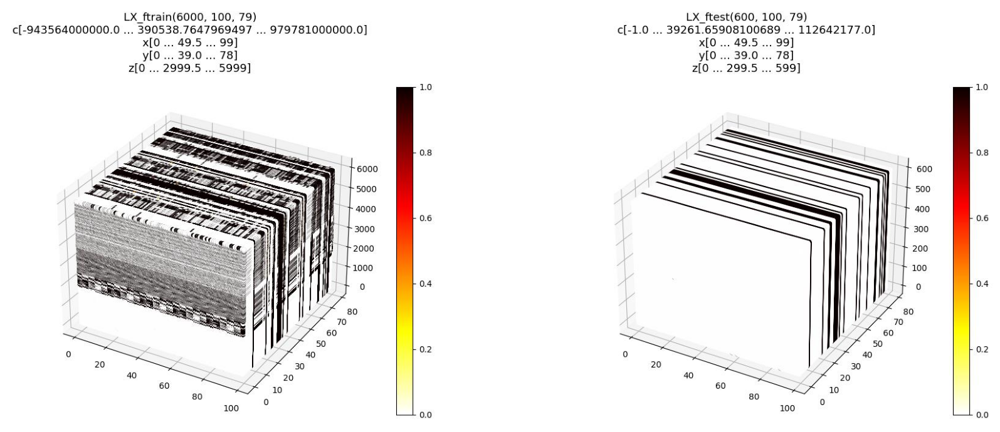

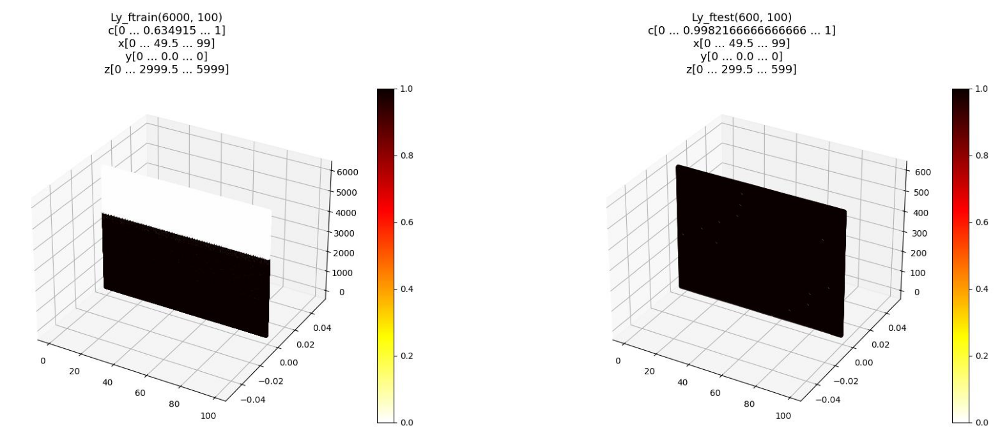

In [12]:
#@title overview featured vs normalized data IMG

show_4d_imgs(['LX_ftrain','LX_ftest'])
show_4d_imgs(['Ly_ftrain','Ly_ftest'])

# 4.INTRODUCTION

To create powerful models, especially for solving Seq2Seq learning problems, LSTM is the key layer.
To use LSTM effectively in models, we need to understand how it generates different results with respect to given parameters.

## 4.1.QUICK RECAP OF LSTM

### 4.1.1.Internal Structure

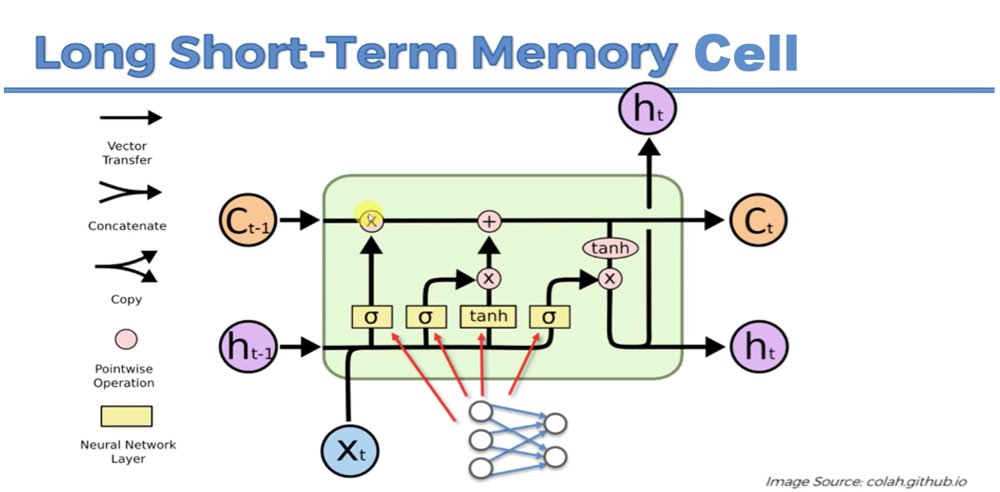

### 4.1.2.Roll-Out Representation of LSTM for each Time Step

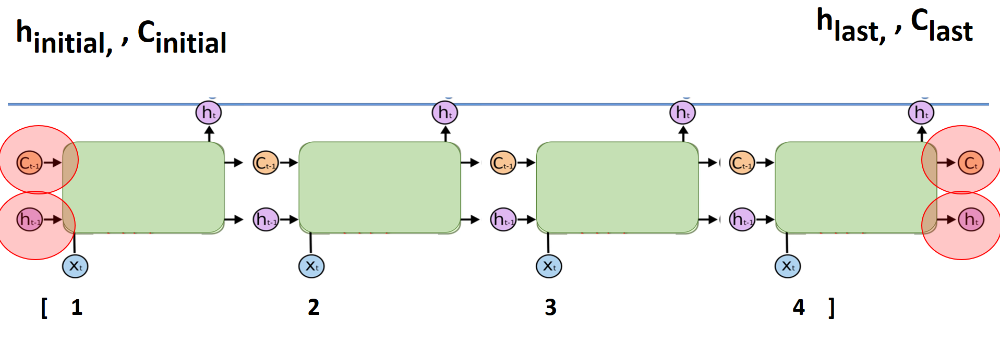

# 5.LSTM Anomaly State management

## 5.1.Model layers



In [13]:
def new_model5():
  num_outputs = 2
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.keras.activations.linear, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model5: Model = Model(
      inputs=
      [
        input_layer,
        #seq_in,
        state_in_h,
        state_in_c
      ],
      outputs=[logits, values, state_h, state_c])
  return model5

model5 = new_model5()
model5.summary()

h = np.zeros((train_size, cell_size), np.float32)
c = np.zeros((train_size, cell_size), np.float32)
IMG['h'], IMG['c'] = ray.get([
    show_scattered_4d.remote(h, "h"),
    show_scattered_4d.remote(c, "c"),
])

2023-01-27 13:55:03.014274: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-27 13:55:03.015065: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-27 13:55:03.015840: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capability: 8.6
2023-01-27 13:55:03.016595: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 13348 MB memory:  -> device: 3, name: NVIDIA A16, pci bus id: 0000:42:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, None, 79)]   0           []                               
                                                                                                  
 dense1 (Dense)                 (None, None, 230)    18400       ['inputs[0][0]']                 
                                                                                                  
 h (InputLayer)                 [(None, 320)]        0           []                               
                                                                                                  
 c (InputLayer)                 [(None, 320)]        0           []                               
                                                                                              

## 5.2.Train



In [14]:
#@title state function

def train_state(model, x=LX_ftrain, h=h, c=c, y=Ly_ftrain, title=['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain']):
  compile = model.predict([x, h, c])
  IMG[f"{title[4]}_predicted"], IMG[f"{title[4]}_h"], IMG[f"{title[4]}_c"] = ray.get([
    show_scattered_4d.remote(compile[1], f"{title[4]}_predicted"),
    show_scattered_4d.remote(compile[2], f"{title[4]}_h"),
    show_scattered_4d.remote(compile[3], f"{title[4]}_c"),
  ])

  show_4d_imgs([title[1], title[4], f"{title[4]}_predicted"])
  show_4d_imgs([title[1], title[2], f"{title[4]}_h"])
  show_4d_imgs([title[1], title[3], f"{title[4]}_c"])

2023-01-27 13:56:27.606306: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-01-27 13:56:29.837878: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8204


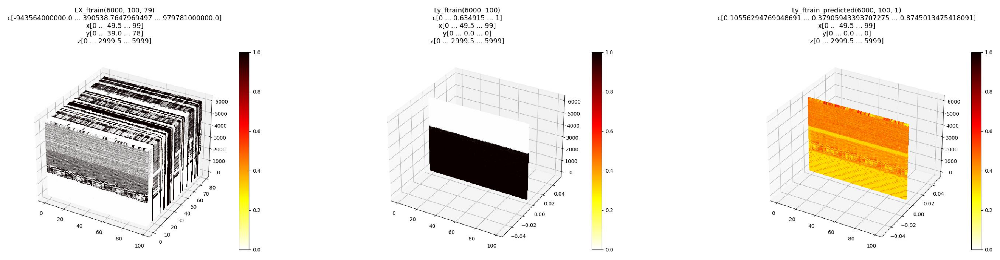

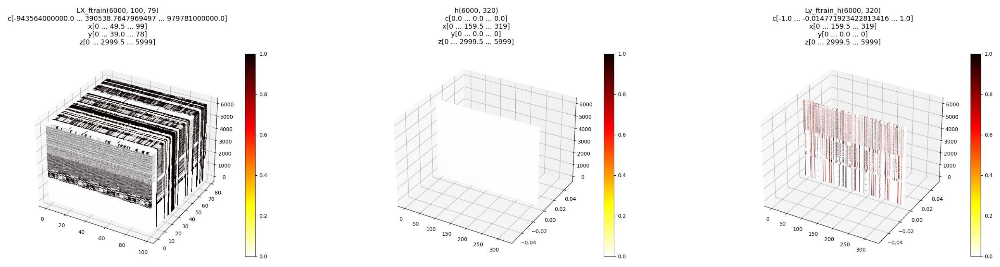

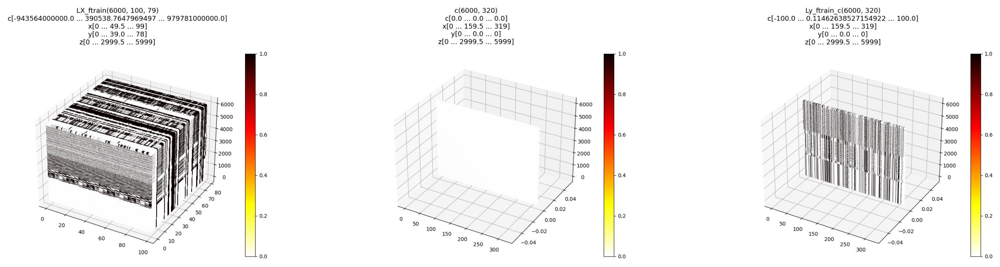

In [15]:
#@title train state

#model5.compile("adam", "binary_crossentropy", metrics=["accuracy"])
train_state(new_model5(), LX_ftrain, h, c, Ly_ftrain, ['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain'])

In [16]:
#@title train function
def ftrain(model, name='model'):
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_ftrain, Ly_ftrain, batch_size=batch_size, epochs=epochs, validation_data=(LX_ftest, Ly_ftest))
  show_train_metric(history, name)
  model.save(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_cic_ssh/{name}")
  open(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_cic_ssh/{name}/features.json", "w").write(json.dumps(features))

In [17]:
## 5.3.Infer

In [22]:
#@title infer function

def finfer(name='model'):
  model = keras.models.load_model(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_cic_ssh/{name}")
  ##############LX_ftrain
  L_fresult1=model.predict(LX_ftrain)
  ##############LX_ftest
  L_fresult2=model.predict(LX_ftest)

  IMG['Ly_ftrain_predicted'], IMG['Ly_ftest_predicted'] = ray.get([
    show_scattered_4d.remote(L_fresult1, "Ly_ftrain_predicted"),
    show_scattered_4d.remote(L_fresult2, "Ly_ftest_predicted"),
  ])
  show_4d_imgs(['LX_ftrain','Ly_ftrain','Ly_ftrain_predicted'])
  show_4d_imgs(['LX_ftest','Ly_ftest','Ly_ftest_predicted'])


___

# 6.LSTM Anomaly model (Primary)

## 6.1.Model layers



In [19]:
def new_model6():
  num_outputs = 10
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  #state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  #state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  #tf.nn.sigmoid
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      #initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model6: Model = Model(
      inputs=input_layer,
      #[
      #  input_layer, #seq_in,
      #  state_in_h,
      #  state_in_c
      #],
      outputs=values
      #[
      #  logits,
      #  values,
      #  state_h,
      #  state_c
      #]
      )
  return model6

model6 = new_model6()
model6.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, None, 79)]        0         
                                                                 
 dense1 (Dense)              (None, None, 230)         18400     
                                                                 
 lstm (LSTM)                 [(None, None, 320),       705280    
                              (None, 320),                       
                              (None, 320)]                       
                                                                 
 values (Dense)              (None, None, 1)           321       
                                                                 
Total params: 724,001
Trainable params: 724,001
Non-trainable params: 0
_________________________________________________________________


## 6.2.Train



Epoch 1/100
188/188 [==============================] - 6s 18ms/step - loss: 0.2526 - accuracy: 0.8935 - val_loss: 0.0488 - val_accuracy: 0.9998
Epoch 2/100
188/188 [==============================] - 3s 15ms/step - loss: 0.0494 - accuracy: 0.9944 - val_loss: 0.0192 - val_accuracy: 0.9998
Epoch 3/100
188/188 [==============================] - 3s 15ms/step - loss: 0.0368 - accuracy: 0.9947 - val_loss: 0.0094 - val_accuracy: 0.9998
Epoch 4/100
188/188 [==============================] - 3s 17ms/step - loss: 0.0333 - accuracy: 0.9938 - val_loss: 0.0072 - val_accuracy: 0.9998
Epoch 5/100
188/188 [==============================] - 3s 15ms/step - loss: 0.0280 - accuracy: 0.9946 - val_loss: 0.0039 - val_accuracy: 0.9998
Epoch 6/100
188/188 [==============================] - 3s 15ms/step - loss: 0.0296 - accuracy: 0.9941 - val_loss: 0.0054 - val_accuracy: 0.9998
Epoch 7/100
188/188 [==============================] - 3s 17ms/step - loss: 0.0275 - accuracy: 0.9938 - val_loss: 0.0080 - val_accuracy:

2023-01-27 14:02:56.564845: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


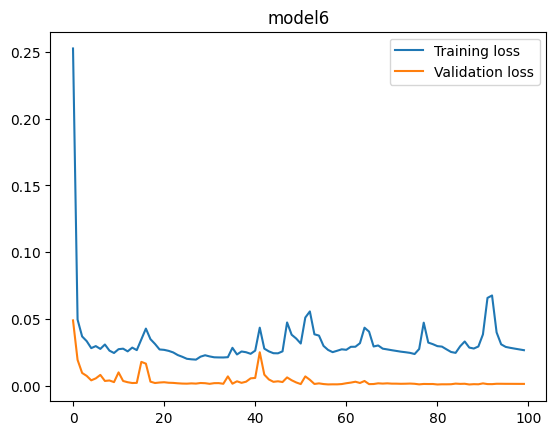

In [20]:
ftrain(model6, 'model6')

## 6.3.Infer



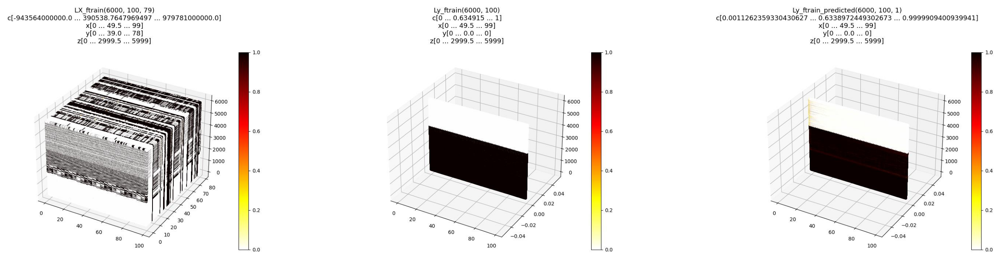

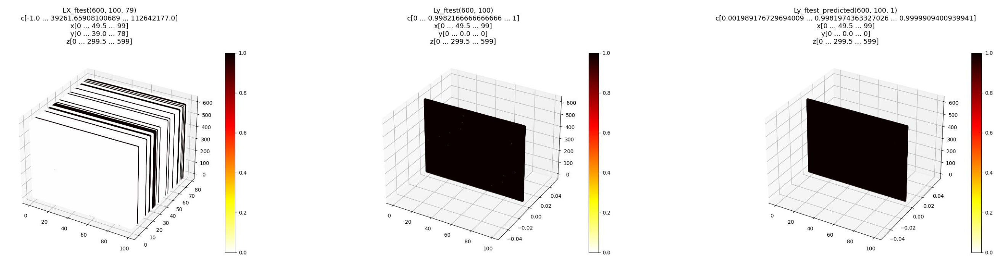

In [23]:
finfer('model6')

# 7.MODEL WEIGHTS SUMMARY

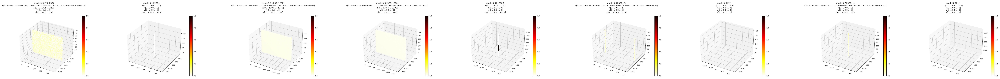

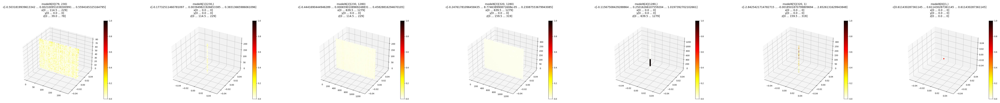

In [24]:
weights5 = show_weights(model5, 'model5')
weights6 = show_weights(model6, 'model6')

show_4d_imgs(weights5)
show_4d_imgs(weights6)